In [62]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns

np.seterr(divide='ignore', invalid='ignore')

weather_df = pd.read_csv("weatherHistory.csv")
weather_df.drop_duplicates(inplace=True)
weather_df.reset_index(drop=True, inplace=True)
weather_df.shape
weather_df.fillna(method="bfill",inplace=True)
#weather_df.isnull().sum()
#weather_df.head(3)
#weather_df.shape
#weather_df.describe().T
#matrix = weather_df.corr()

#from sklearn.preprocessing import LabelEncoder
#le = LabelEncoder()
#weather_df["Summary"] = le.fit_transform(weather_df["Summary"])

weather_df["Formatted Date"] = pd.to_datetime(weather_df["Formatted Date"], format = "%Y-%m-%d %H:%M:%S.%f %z") 

weather_df["year"]  = weather_df["Formatted Date"].apply(lambda x: x.year)
weather_df["month"] = weather_df["Formatted Date"].apply(lambda x: x.month)
weather_df["day"]   = weather_df["Formatted Date"].apply(lambda x: x.day)

dms = pd.get_dummies(weather_df["Precip Type"])
weather_df = pd.concat([weather_df,dms[["rain","snow"]]],axis=1)

weather_df.drop(["Summary","Daily Summary","Precip Type","Loud Cover","Apparent Temperature (C)", "rain"],axis=1,inplace=True)

weather_df.rename(columns={"Formatted Date" : "date","Temperature (C)": "Temperature","Humidity":"humidity","Wind Speed (km/h)":"wind_speed",
                   "Wind Bearing (degrees)":"wind_bearing","Visibility (km)":"visibility","Pressure (millibars)":"pressure"},inplace=True)
weather_df.head()

weather_df.isnull().sum()


import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import datetime ## Time Series analysis.

#weather_df.columns=['year', 'month', 'Temperature', 'day']
weather_df.sort_values(by='date', inplace=True) ## To get the time series right.
fig = go.Figure(layout = go.Layout(yaxis=dict(range=[-25, weather_df['Temperature'].max()+1])))
fig.add_trace(go.Scatter(x=weather_df['date'], y=weather_df['Temperature']), )
fig.update_layout(title='Temprature Throught Timeline:',
                 xaxis_title='Time', yaxis_title='Temprature in Degrees')
fig.update_layout(xaxis=go.layout.XAxis(
    rangeselector=dict(
        buttons=list([dict(label="Whole View", step="all"),
                      dict(count=1,label="One Year View",step="year",stepmode="todate")                      
                     ])),
        rangeslider=dict(visible=True),type="date")
)
fig.show()

fig = px.box(weather_df, 'month', 'Temperature')
fig.update_layout(title='Warmest, Coldest and Median Monthly Tempratue.')
fig.show()

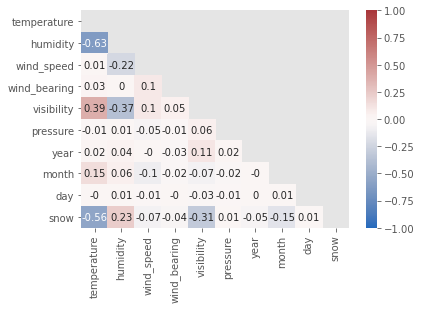

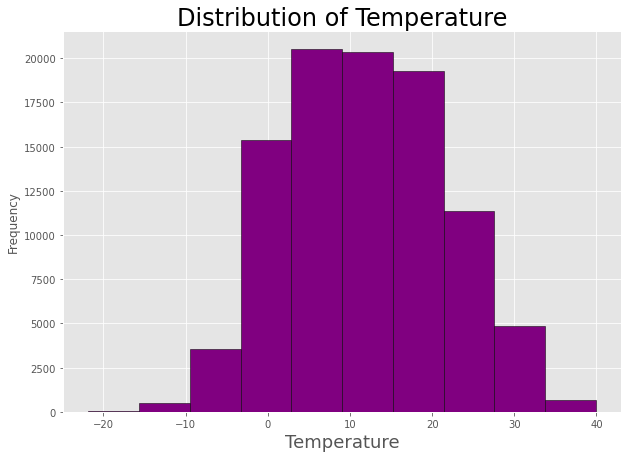

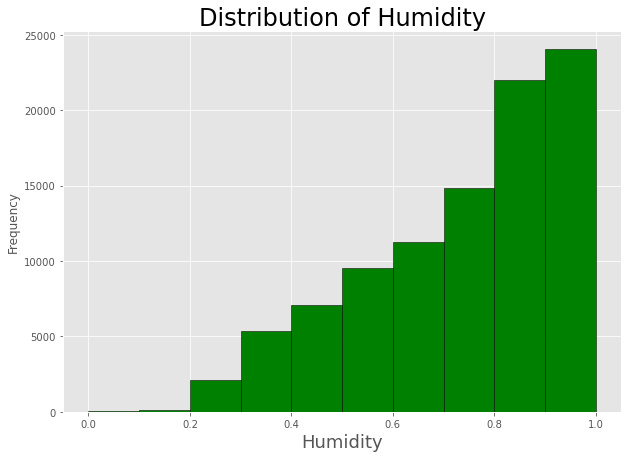

[13.951  1.366  1.057  4.904  1.876  1.458  1.67   1.116    inf]
[ True False False  True  True False  True False  True]
[[8.900e-01 9.982e+00 1.017e+03 1.000e+00 0.000e+00]
 [8.500e-01 9.902e+00 1.016e+03 1.000e+00 0.000e+00]
 [8.200e-01 9.902e+00 1.016e+03 1.000e+00 0.000e+00]
 [8.200e-01 9.902e+00 1.016e+03 1.000e+00 0.000e+00]
 [8.600e-01 9.902e+00 1.015e+03 1.000e+00 0.000e+00]]


In [54]:


#ploting the triangle heatmap for correlation
matrix = weather_df.corr().round(2)
mask = np.triu(np.ones_like(matrix, dtype=bool))
sns.heatmap(matrix, annot=True, vmax=1, vmin=-1, center=0, cmap='vlag', mask=mask)
plt.show()


plt.style.use('ggplot')

# histogram of the Temperature
weather_df.Temperature.plot(kind='hist', color='purple', edgecolor='black', figsize=(10,7))
plt.title('Distribution of Temperature', size=24)
plt.xlabel('Temperature', size=18)
plt.show()

# histogram of the humidity
weather_df.humidity.plot(kind='hist', color='green', edgecolor='black', figsize=(10,7))
#weather_df.iloc[499:999].plt.scatter(x = 'Temperature', y = 'humidity' , figsize=(10,7))
plt.title('Distribution of Humidity', size=24)
plt.xlabel('Humidity', size=18)
plt.show()


# Feature Selection with Univariate Statistical Tests
from pandas import read_csv
from numpy import set_printoptions
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
# load data

X = weather_df.drop(columns = ["Temperature", "date"],axis=1)
Y= weather_df["Temperature"]
# feature extraction
test = SelectKBest(score_func=f_classif, k=5)
fit = test.fit(X, Y)
# summarize scores
set_printoptions(precision=3)
print(fit.scores_)
print(test.get_support())
features = fit.transform(X)
# summarize selected features
print(features[0:5,:])


In [47]:

x = weather_df.drop(["Temperature", "date"],axis=1)
weather_df1 = x.copy()
y= weather_df["Temperature"]

from sklearn.preprocessing import StandardScaler
sc = StandardScaler().fit(x)
x = pd.DataFrame(sc.transform(x))

from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=42)


from sklearn.linear_model import Ridge,Lasso,ElasticNet,LinearRegression
from sklearn.metrics import mean_squared_error,r2_score


######################## Train Starts ########################
ridge_model = Ridge().fit(x_train,y_train)
y_pred = ridge_model.predict(x_train)
print("Ridge Regression Train R2 Score : %",r2_score(y_train, y_pred)*100)

lasso_model = Lasso().fit(x_train,y_train)
y_pred = lasso_model.predict(x_train)
print("Lasso Regression Train R2 Score : %",r2_score(y_train, y_pred)*100)

elastic_model = ElasticNet().fit(x_train,y_train)
y_pred = elastic_model.predict(x_train)
print("ElasticNet Regression Train R2 Score : %",r2_score(y_train, y_pred)*100)

linReg_model = LinearRegression().fit(x_train,y_train)
y_pred = linReg_model.predict(x_train)
print("Linear Regression Train R2 Score : %",r2_score(y_train, y_pred)*100)

######################## Test Starts ########################
ridge_model = Ridge().fit(x_train,y_train)
y_pred = ridge_model.predict(x_test)
print("Ridge Regression Test R2 Score : %",r2_score(y_test, y_pred)*100)

lasso_model = Lasso().fit(x_train,y_train)
y_pred = lasso_model.predict(x_test)
print("Lasso Regression Test R2 Score : %",r2_score(y_test, y_pred)*100)

elastic_model = ElasticNet().fit(x_train,y_train)
y_pred = elastic_model.predict(x_test)
print("ElasticNet Regression Test R2 Score : %",r2_score(y_test, y_pred)*100)

linReg_model = LinearRegression().fit(x_train, y_train)
y_pred = linReg_model.predict(x_test)
print("Linear Regression Test R2 Score : %",r2_score(y_test, y_pred)*100)




Ridge Regression Train R2 Score : % 62.2677844028944
Lasso Regression Train R2 Score : % 57.50630270257899
ElasticNet Regression Train R2 Score : % 53.83918160629507
Linear Regression Train R2 Score : % 62.267784412438274
Ridge Regression Test R2 Score : % 61.61127946518816
Lasso Regression Test R2 Score : % 57.28060865920681
ElasticNet Regression Test R2 Score : % 53.55014699107515
Linear Regression Test R2 Score : % 61.611270284490004


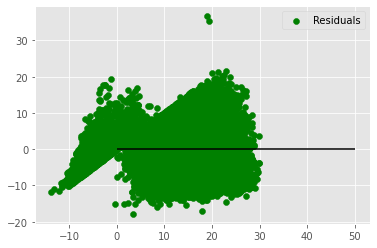

In [56]:
print()

plt.scatter(y_pred, y_pred - y_test, color = 'green', label = 'Residuals')
plt.hlines(y=0, xmin = 0, xmax = 50, color = 'black')
plt.legend()
plt.show()

0.6161127028449
